In [1]:
# -*- coding: utf-8 -*-
import numpy as np
import matplotlib.pyplot as plt
 
#%% Training patterns and targets
X = np.array([[2, 7], [3, 9], [4, 4], [5, 7], [6, 11], [7, 4], [8,6], [8,9], [10, 6], [10, 9]])
t = np.array([0, 0, 0, 1, 0, 0, 1, 1, 1 ,1])
testinga=[]

alpha = 0.5
epochs = 9000
 
# Pesos iniciales
w1 = np.array([[0.1, 0.2], [-0.4, 0.5]]) # w_2
b1 = np.array([0.3, -0.6]) # b_2
w2 = np.array([0.7, 0.8]) # w_3
b2 = np.array([-0.9]) #b_3

In [2]:
err_vector = []
for epoch in range(epochs):
    count = 0
    err = 0
    for x in X:
        # Feed forward
        ####primera capa
        z1 = np.dot(x, w1.T) + b1 
        # Sigmoid function
        a1 = 1 / (1 + np.exp(-z1)) #a_2
        ####segunda capa
        z2 = np.dot(a1, w2) + b2
        # Sigmoid function
        a2 = 1 / (1 + np.exp(-z2)) #a_3
        
        
        # Network error
        err += 0.5 * np.power(t[count] - a2, 2)
        
        #### Back propagation        
        L_error = -(t[count] - a2) * a2 * (1 - a2)
        
        # New output weights and bias
        n_w2 = w2 - alpha * L_error * a1
        n_b2 = b2 - alpha * L_error
        
        # Hidden layer error (l)
        l_error = L_error * w2 * a1 * (1 - a1)
        
        # New hidden weights and bias
        n_b1 = b1 - alpha * l_error
        x = np.reshape(x, (1, len(x)))
        l_error = np.reshape(l_error, (len(l_error), 1))
        n_w1 = w1 - alpha * np.multiply(l_error, x)
        
        # Actualizacion de pesos y bias
        w1 = n_w1
        b1 = n_b1
        w2 = n_w2
        b2 = n_b2
        
        count += 1
        
    err_vector.append(err / X.shape[0])
    

       MLP result      
Pat:          t:      out:
0. [2 7] ---- 0 ----> 0.013
1. [3 9] ---- 0 ----> 0.015
2. [4 4] ---- 0 ----> 0.016
3. [5 7] ---- 1 ----> 0.986
4. [ 6 11] ---- 0 ----> 0.016
5. [7 4] ---- 0 ----> 0.021
6. [8 6] ---- 1 ----> 0.982
7. [8 9] ---- 1 ----> 0.990
8. [10  6] ---- 1 ----> 0.985
9. [10  9] ---- 1 ----> 0.990


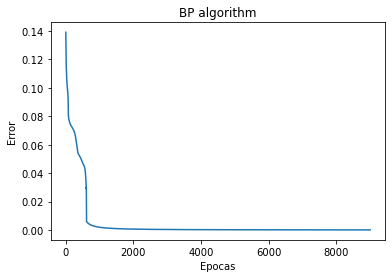

In [3]:
#%% Testing patterns
print('       MLP result      ')
print('Pat:          t:      out:')
count = 0
for x in X:
    # Feed forward
    ####primera capa
    z1 = np.dot(x, w1.T) + b1 
    # Sigmoid function
    a1 = 1 / (1 + np.exp(-z1)) 
    ####segunda capa
    z2 = np.dot(a1, w2) + b2
    # Sigmoid function
    a2 = 1 / (1 + np.exp(-z2))
    print('{}. {} ---- {} ----> {:.3f}'.format(count, x, t[count], float(a2)))
    count += 1
    testinga.append(a1)
    
#%%%   
# Graph error
 
plt.figure(0)
plt.plot(err_vector)
plt.xlabel('Epocas')
plt.ylabel('Error')
plt.title('BP algorithm')
plt.show()

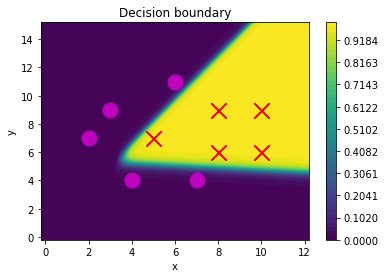

In [4]:
# Decision boundaries
#def dec_boundaries(X, t, w_2, b_2, w_3, b_3):
    
# Creating mesh
h = 0.01
x_min, x_max = -0.2, 12.2
y_min, y_max = -0.2, 15.2
 
xx, yy = np.meshgrid(np.arange(x_min, x_max, h),np.arange(y_min, y_max, h))
 
Z = np.c_[xx.ravel(), yy.ravel()]
out = np.zeros(np.shape(Z)[0])
 
#%% Output model
for i in range(len(out)):
    # Feed forward
    ####primera capa
    z1 = np.dot(Z[i], w1.T) + b1 
    # Sigmoid function
    a1 = 1 / (1 + np.exp(-z1)) 
    ####segunda capa
    z2 = np.dot(a1, w2) + b2
    # Sigmoid function
    a2 = 1 / (1 + np.exp(-z2))
    out[i] = a2
    
# out = (out >= 0.5).astype(int)
out = out.reshape(xx.shape)
levels = np.linspace(0, 1)
plt.figure(1)
plt.contourf(xx, yy, out, levels)
plt.colorbar()
 
# Plotting data
lis = np.unique(t)
for i in range(len(t)):
    if i == 0:
        pos = np.where(t == 0)[0]
        plt.plot(X[pos][:, 0], X[pos][:, 1], 'o', color = 'm', markersize = 15)
    else:
        pos = np.where(t == 1)[0]
        plt.plot(X[pos][:, 0], X[pos][:, 1], 'x', color = 'r', markersize = 15)
 
plt.title('Decision boundary')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

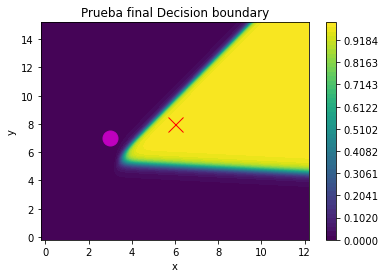

In [5]:
# out = (out >= 0.5).astype(int)
out = out.reshape(xx.shape)
levels = np.linspace(0, 1)
plt.figure(2)
plt.contourf(xx, yy, out, levels)
plt.colorbar()
 
# Plotting data
plt.plot(3, 7, 'o', color = 'm', markersize = 15)
plt.plot(6, 8, 'x', color = 'r', markersize = 15)
plt.title('Prueba final Decision boundary')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

In [7]:
print(testinga)

[array([1.02430103e-05, 9.84313513e-01]), array([2.38157018e-06, 9.99926120e-01]), array([0.99976092, 0.03857153]), array([0.97417676, 0.9913718 ]), array([0.01303354, 0.99999977]), array([1.      , 0.068434]), array([1.        , 0.94063522]), array([0.99999522, 0.99997304]), array([1.        , 0.95953948]), array([1.        , 0.99998199])]


In [8]:
print(z1)

[13.25435213 27.37403974]


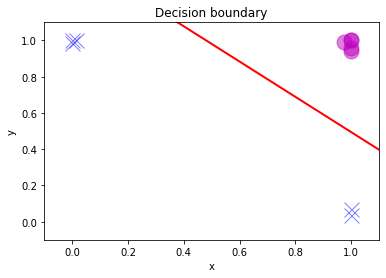

In [26]:
plt.figure(3)

plt.xlim(xmin = -0.1, xmax=1.1)
plt.ylim(ymin = -0.1, ymax=1.1)
lis = np.unique(testinga)
for i in range(len(testinga)):
    if testinga[i][0] >= 0.5 and testinga[i][1] >= 0.5:
        plt.plot( testinga[i][0], testinga[i][1], 'o', color = 'm', markersize = 15, alpha=0.5)
    else:
        plt.plot( testinga[i][0], testinga[i][1], 'x', color = 'b', markersize = 15, alpha=0.5)
x_map = np.linspace(-0.1, 1.1)
y_map = -(w2[0] / w2[1]) * (x_map)-(b2/w2[1])

plt.plot(x_map, y_map, color = 'r', linewidth=2)
plt.title('Decision boundary')
plt.xlabel('x')
plt.ylabel('y')
plt.show()